# Week 6 - Bivariate Analysis, part 2

# 1. Lesson: no lesson this week

# 2. Weekly graph question

Suppose you wanted to show the nitrate and phosphate level in a water sample.  What are the advantages and disadvantages of showing this as an area plot, as opposed to two separate line graphs?  How would you adjust the graphs shown to improve the presentation?

In [2]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import kagglehub
import os

C:\Users\serge\AppData\Local\Temp\ipykernel_16052\2149468501.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')


Text(0, 0.5, 'Nitrate level (% of eutrophic value)')

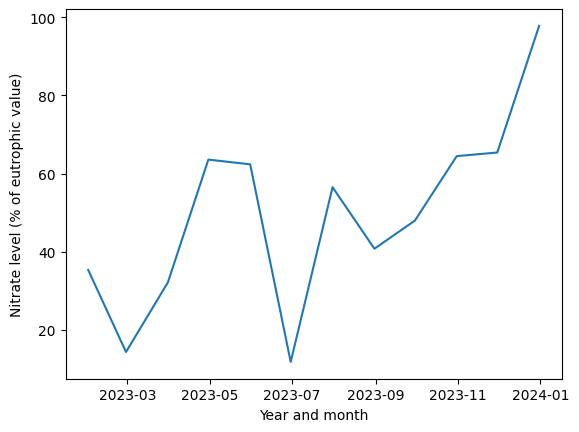

In [3]:
numdates = 12
np.random.seed(0)
time_series = 100 * (np.random.normal(size = numdates) / 5 + np.arange(numdates) / 16)
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series)
ax.set_xlabel("Year and month")
ax.set_ylabel("Nitrate level (% of eutrophic value)")

C:\Users\serge\AppData\Local\Temp\ipykernel_16052\1726504607.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')


Text(0, 0.5, 'Phosphate level (% of eutrophic value)')

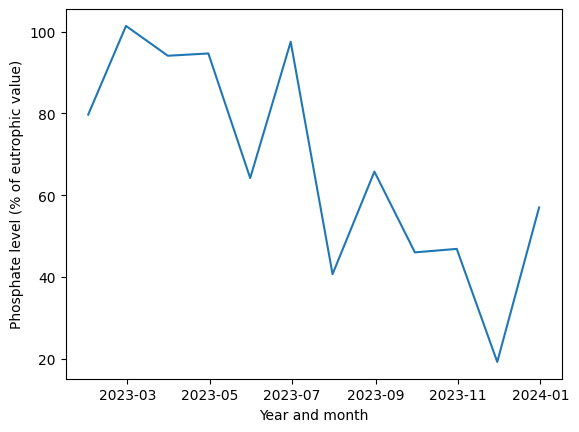

In [4]:
np.random.seed(1)
time_series_2 =  100 * (1 - (np.random.normal(size = numdates) / 8 + np.arange(numdates) / 16))
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')
ax = sns.lineplot(x = datearray, y = time_series_2)
ax.set_xlabel("Year and month")
ax.set_ylabel("Phosphate level (% of eutrophic value)")

<Axes: >

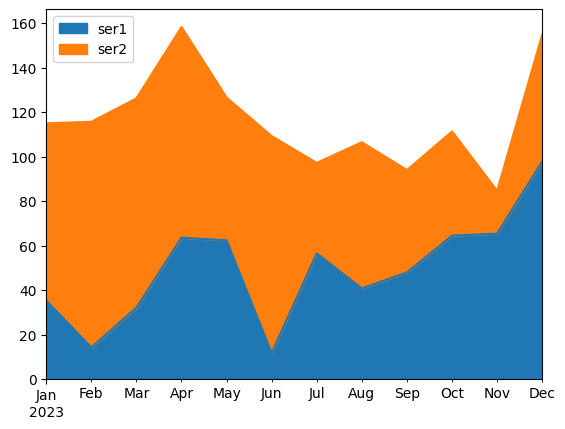

In [5]:
df = pd.DataFrame({'ser1': time_series, 'ser2': time_series_2}, index = datearray)
df.plot.area()

C:\Users\serge\AppData\Local\Temp\ipykernel_16052\416949720.py:9: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')


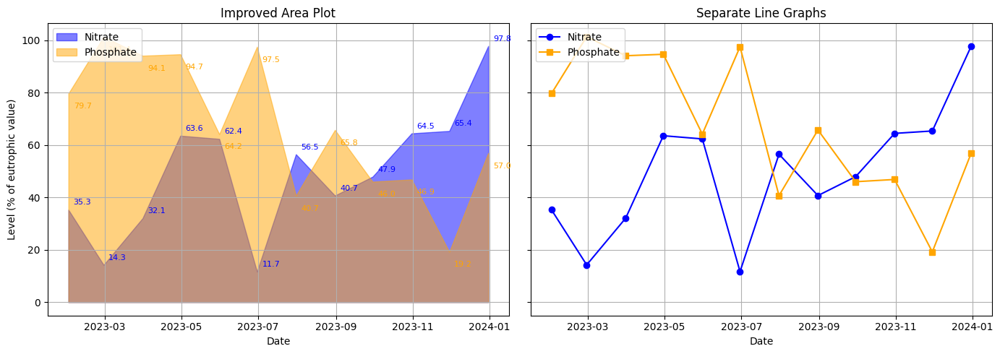

In [6]:
import matplotlib.pyplot as plt

# Generate sample data for nitrate and phosphate levels
numdates = 12
np.random.seed(0)
nitrate = 100 * (np.random.normal(size=numdates) / 5 + np.arange(numdates) / 16)
np.random.seed(1)
phosphate = 100 * (1 - (np.random.normal(size=numdates) / 8 + np.arange(numdates) / 16))
datearray = pd.date_range(start='2023/01/01', end='2024/01/01', freq='M')

# Create a DataFrame to hold the data
df = pd.DataFrame({'Nitrate': nitrate, 'Phosphate': phosphate}, index=datearray)

# Create a figure with two subplots side-by-side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 5), sharey=True)

# -----------------------
# Left subplot: Improved Area Plot
# -----------------------
# Use fill_between for each series with transparency to avoid overlap issues
axes[0].fill_between(datearray, df['Nitrate'], color='blue', alpha=0.5, label='Nitrate')
axes[0].fill_between(datearray, df['Phosphate'], color='orange', alpha=0.5, label='Phosphate')
axes[0].set_title("Improved Area Plot")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Level (% of eutrophic value)")
axes[0].grid(True)
axes[0].legend(loc='upper left')

# Adding annotations to show specific values at each date for clarity
for date, val in zip(datearray, df['Nitrate']):
    axes[0].annotate(f"{val:.1f}", xy=(date, val), xytext=(5, 5),
                     textcoords="offset points", fontsize=8, color='blue')
for date, val in zip(datearray, df['Phosphate']):
    axes[0].annotate(f"{val:.1f}", xy=(date, val), xytext=(5, -15),
                     textcoords="offset points", fontsize=8, color='orange')

# -----------------------
# Right subplot: Separate Line Graphs
# -----------------------
# Plot nitrate and phosphate with markers and gridlines for clear individual trends
axes[1].plot(datearray, df['Nitrate'], marker='o', linestyle='-', color='blue', label='Nitrate')
axes[1].plot(datearray, df['Phosphate'], marker='s', linestyle='-', color='orange', label='Phosphate')
axes[1].set_title("Separate Line Graphs")
axes[1].set_xlabel("Date")
axes[1].grid(True)
axes[1].legend(loc='upper left')

plt.tight_layout()
plt.show()


#### Area Plot Advantages:
- Shows overall nutrient load and relative contributions.
- Provides a visually impactful cumulative view.

#### Area Plot Disadvantages:
- Overlapping areas can obscure individual trends.
- Harder to pinpoint exact values.

#### Separate Line Graph Advantages:
- Clearly displays individual trends.
- Facilitates precise comparisons.

#### Improvements:
- Use transparency/hatching in area plots to reduce overlap.
- For line graphs, consider shared axes and markers for clarity.

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your own datasets that you found last semester.

### Here are some types of analysis you can do:

- Find correlations between pairs of variables.

- Draw scatterplots, especially when the correlation is large.

- Draw pairplots.

- Draw line graphs and/or area graphs when there is date or time data together with numerical data.

### Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If the data are not useable, find some new data!

- Do you see any outliers?  (Data points that are far from the rest of the data).

- Are any data items highly correlated with each other, suggesting that they are redundant?

- For the line plots, do you see a trend or pattern over time?  Does this suggest that the data are changing over time (drifting) in such a way as to invalidate comparisons?

- Can you think of any confounding variables?  (Third variables that could explain any correlations between other variables.  These third variables may or may not be reported in the dataset.)

In [7]:
# set variables
df = pd.read_csv("data//auto//insurance_claims.csv")
print("First few rows of the dataset:")
print(df.head())
 
df.head()

dataset = df.copy()

First few rows of the dataset:
   months_as_customer  age  policy_number policy_bind_date policy_state  \
0                 328   48         521585       2014-10-17           OH   
1                 228   42         342868       2006-06-27           IN   
2                 134   29         687698       2000-09-06           OH   
3                 256   41         227811       1990-05-25           IL   
4                 228   44         367455       2014-06-06           IL   

  policy_csl  policy_deductable  policy_annual_premium  umbrella_limit  \
0    250/500               1000                1406.91               0   
1    250/500               2000                1197.22         5000000   
2    100/300               2000                1413.14         5000000   
3    250/500               2000                1415.74         6000000   
4   500/1000               1000                1583.91         6000000   

   insured_zip  ... police_report_available total_claim_amount injury_cla

In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [12]:
# Delete control column: _c39
dataset.drop('_c39', axis=1, inplace=True)


In [17]:
# Find Correlations:
# Compute the correlation matrix for numerical variables
df_numeric = dataset.select_dtypes(include=['number','float64','int64']).drop(columns=['policy_number'])
correlation_matrix = df_numeric.corr()
correlation_matrix


,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922098,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292
age,0.922098,1.000000,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354
policy_deductable,0.026807,0.029188,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105
policy_annual_premium,0.005018,0.014404,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226
umbrella_limit,0.015498,0.018126,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893
insured_zip,0.017895,0.025604,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736
capital-gains,0.006399,-0.007075,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398
capital-loss,0.020209,0.007368,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615
incident_hour_of_the_day,0.070639,0.087161,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368
number_of_vehicles_involved,0.014736,0.022102,0.051214,-0.045991,-0.021270,0.027448,0.061643,-0.014895,0.120794,1.000000,0.014030,-0.014669,0.274278,0.224650,0.219084,0.269393,0.034554


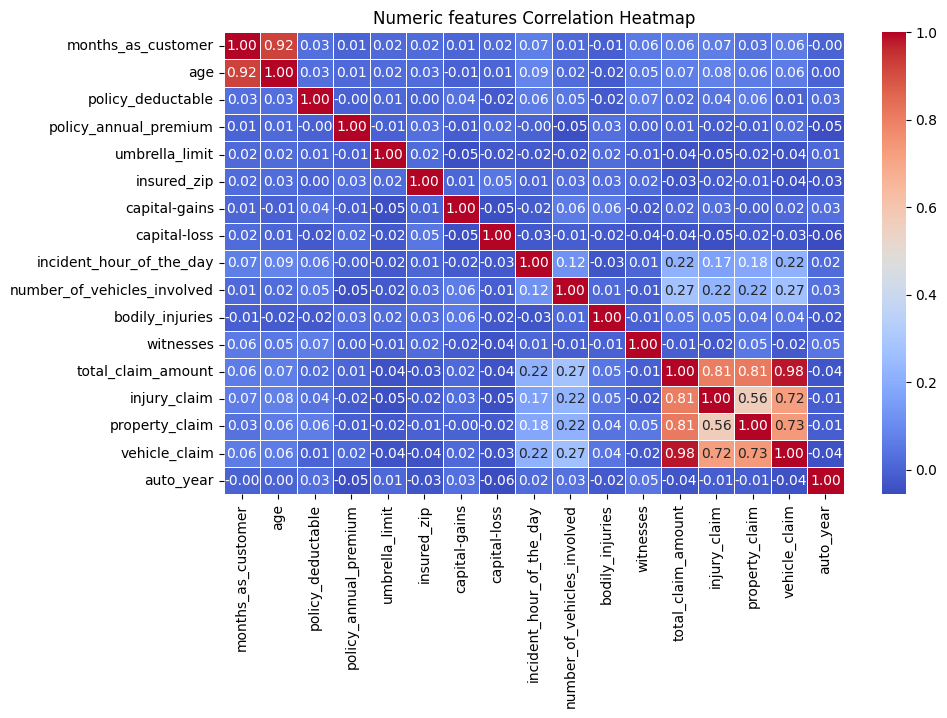

In [14]:
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Numeric features Correlation Heatmap")
plt.show()

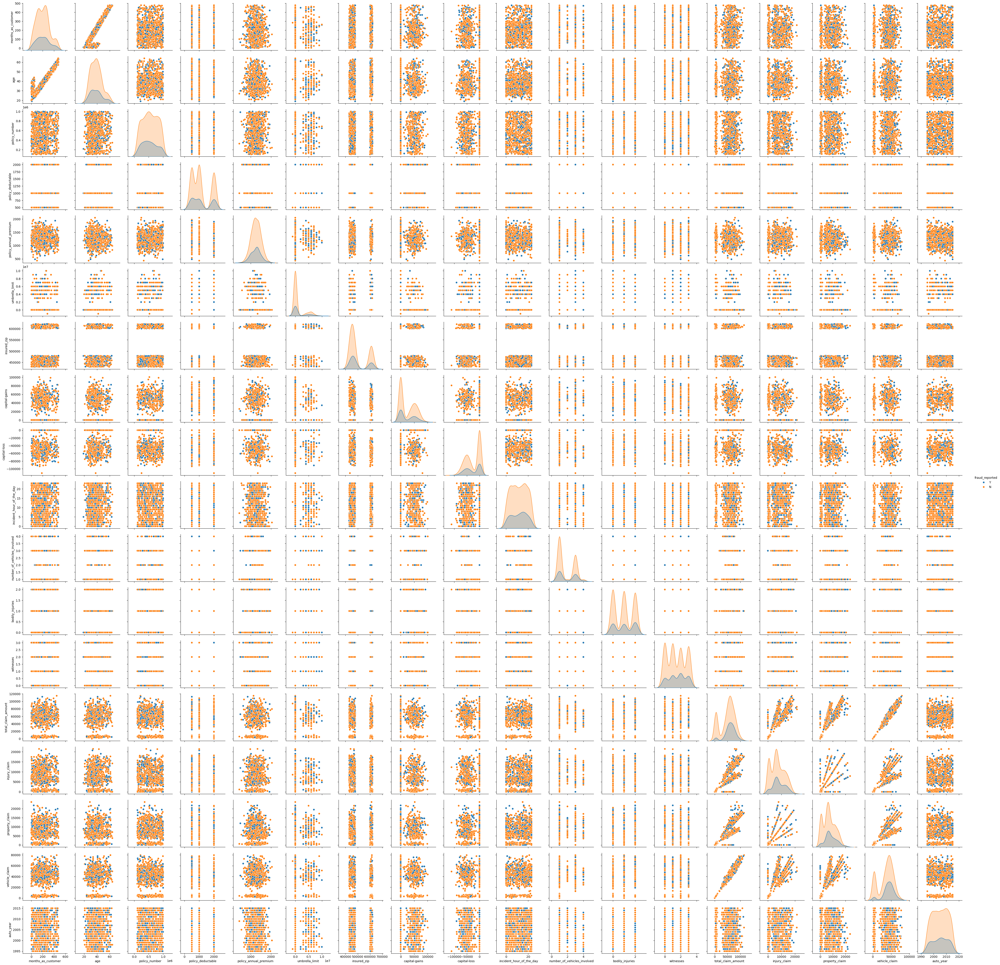

In [16]:
sns.pairplot(dataset, hue="fraud_reported")
plt.show()



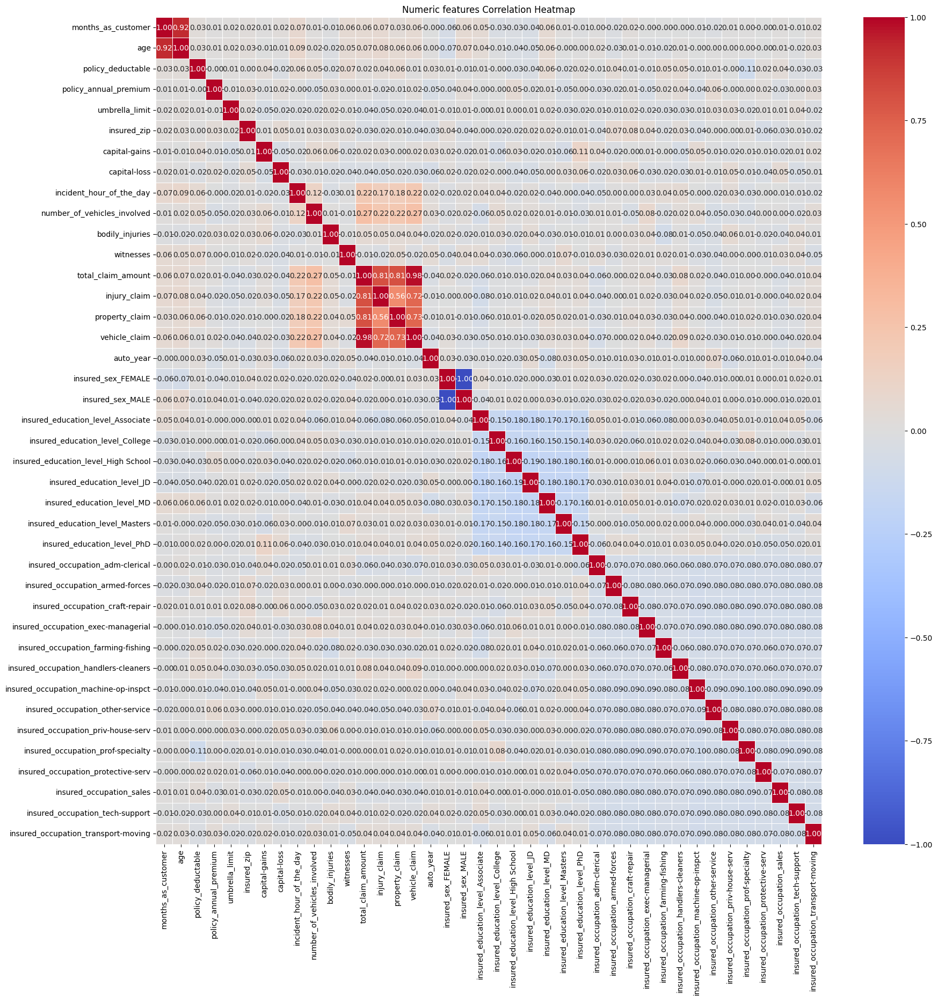

In [18]:
dataset_encoded = pd.get_dummies(dataset, columns=['insured_sex', 'insured_education_level', 'insured_occupation' ])

# Convert all boolean columns to integer format
bool_cols = dataset_encoded.select_dtypes(include=["bool"]).columns
dataset_encoded[bool_cols] = dataset_encoded[bool_cols].astype(int)


plt.figure(figsize=(20, 20))
sns.heatmap(dataset_encoded.select_dtypes(include=['number','float64','int64']).drop(columns=['policy_number']).corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Numeric features Correlation Heatmap")
plt.show()

In [19]:
# Plot Time Series (if Date/Time data exists)
# NOTE: Date/Time data does not exist in this dataset
print("NOTE: Date/Time data does not exist in this dataset")


NOTE: Date/Time data does not exist in this dataset


# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 86-98 of the Storytelling With Data book as best you can.  (The second half of chapter three).  You do not have to get the exact data values right, just the overall look and feel.

#### Figure 3.19 Remove gridlines (page 93)

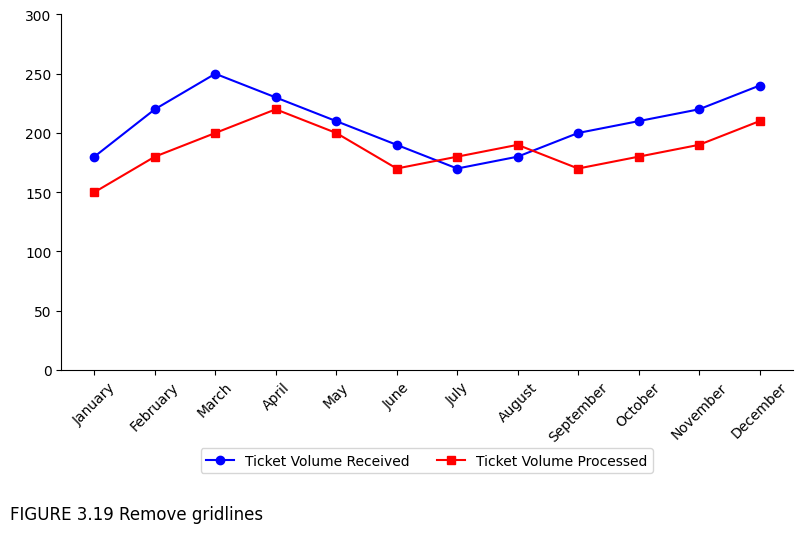

In [20]:

# Sample data
months = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

ticket_volume_received = [180, 220, 250, 230, 210, 190, 170, 180, 200, 210, 220, 240]
ticket_volume_processed = [150, 180, 200, 220, 200, 170, 180, 190, 170, 180, 190, 210]

# Create plot
plt.figure(figsize=(8, 5))

# Plot each series with distinct markers and colors
plt.plot(months, ticket_volume_received, color='blue', marker='o', label='Ticket Volume Received')
plt.plot(months, ticket_volume_processed, color='red', marker='s', label='Ticket Volume Processed')

# Remove gridlines
plt.grid(False)

# Optionally remove top and right spines for a cleaner look
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Adjust y-axis range to roughly match the example
plt.ylim(0, 300)

# Add legend, labels, and title
plt.legend(
    loc='upper center',       # position in the figure
    bbox_to_anchor=(0.5, -0.2),  # adjust X, Y position relative to the axes
    ncol=2                   # number of columns in the legend
)

plt.xticks(rotation=45)

plt.figtext(0, -0.05, "FIGURE 3.19 Remove gridlines", ha='left', fontsize=12)
# Display
plt.tight_layout()
plt.show()
